# Computer Vision 2025 Assignment 1: Image filtering.

In this assignment, you will research, implement and test some image filtering operations. Image filtering by convolution is a fundamental step in many computer vision tasks and you will find it useful to have a firm grasp of how it works. For example, later in the course we will come across Convolutional Neural Networks (CNNs) which are built from convolutional image filters.

The main aims of the assignment are:

- to understand the basics of how images are stored and processed in memory;
- to gain exposure to several common image filters, and understand how they work;
- to get practical experience implementing convolutional image filters;
- to test your intuition about image filtering by running some experiments;
- to report your results in a clear and concise manner.

*This assignment relates to the following ACS CBOK areas: abstraction, design, hardware and software, data and information, HCI and programming.*

## General instructions

Follow the instructions in this Python notebook and the accompanying file *a1code.py* to answer each question. It's your responsibility to make sure your answer to each question is clearly labelled and easy to understand. Note that most questions require some combination of Python code, graphical output, and text analysing or describing your results. Although we will check your code as needed, marks will be assigned based on the quality of your write up rather than for code correctness! This is not a programming test - we are more interested in your understanding of the topic.

Only a small amount of code is required to answer each question. We will make extensive use of the Python libraries

- [numpy](numpy.org) for mathematical functions
- [skimage](https://scikit-image.org) for image loading and processing
- [matplotlib](https://matplotlib.org/stable/index.html) for displaying graphical results
- [jupyter](https://jupyter.org) for Jupyter Notebooks

You should get familiar with the documentation for these libraries so that you can use them effectively.

# The Questions

To get started, below is some setup code to import the libraries we need. You should not need to edit it.

In [153]:
# Numpy is the main package for scientific computing with Python.
import numpy as np

#from skimage import io

# Imports all the methods we define in the file a1code.py
from a1code import *

# Matplotlib is a useful plotting library for python
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Question 0: Numpy warm up! (Not Assesed. This part is for you to understand the basic of numpy)

Before starting the assignment, make sure you have a working Python 3 installation, with up to date versions of the libraries mentioned above. If this is all new to you, I'd suggest  downloading an all in one Python installation such as [Anaconda](https://www.anaconda.com/products/individual). Alternatively you can use a Python package manager such as pip or conda, to get the libraries you need. If you're struggling with this please ask a question on the MyUni discussion forum.

For this assignment, you need some familiarity with numpy syntax. The numpy QuickStart should be enough to get you started:

https://numpy.org/doc/stable/user/quickstart.html

Here are a few warm up exercises to make sure you understand the basics. Answer them in the space below. Be sure to print the output of each question so we can see it!

1. Create a 1D numpy array Z with 12 elements. Fill with values 1 to 12.
2. Reshape Z into a 2D numpy array A with 3 rows and 4 columns.
3. Reshape Z into a 2D numpy array B with 4 rows and 3 columns.
4. Calculate the *matrix* product of A and B.
5. Calculate the *element wise* product of $A$ and $B^T$ (B transpose).


In [154]:
Z = np.array([1,2,3,4,5,6,7,8,9,10,11,12])
# print(Z)
A = Z.reshape(3, 4)
# print(A)
B = Z.reshape(4, 3)
print(B)

matProd = np.matmul(A, B)
# print(matProd)

Bt = np.transpose(B)
print(Bt)

element = np.multiply(A, Bt)
print(element)

[[ 1  2  3]
 [ 4  5  6]
 [ 7  8  9]
 [10 11 12]]
[[ 1  4  7 10]
 [ 2  5  8 11]
 [ 3  6  9 12]]
[[  1   8  21  40]
 [ 10  30  56  88]
 [ 27  60  99 144]]


You need to be comfortable with numpy arrays because that is how we store images. Let's do that next!

## Question 1: Loading and displaying an image (10%)

Below is a function to display an image using the pyplot module in matplotlib. Implement the `load()` and `print_stats()` functions in a1code.py so that the following code loads the mandrill image, displays it and prints its height, width and channel.

In [155]:
def display(img, caption=''):
    # Show image using pyplot
    plt.figure()
    plt.imshow(img)
    plt.title(caption)
    plt.axis('off')
    plt.show()

### Q1 Explanation

To begin, I implemented the `load()` and `print_stats()` functions in `a1code.py`. The `load()` function reads an image using `skimage.io.imread()` and normalizes pixel values to [0.0, 1.0] by dividing by 255. The `print_stats()` function prints the image dimensions and number of channels using its `.shape` property.

As seen below, I load and display the `whipbird.jpg` image and show its dimensions.

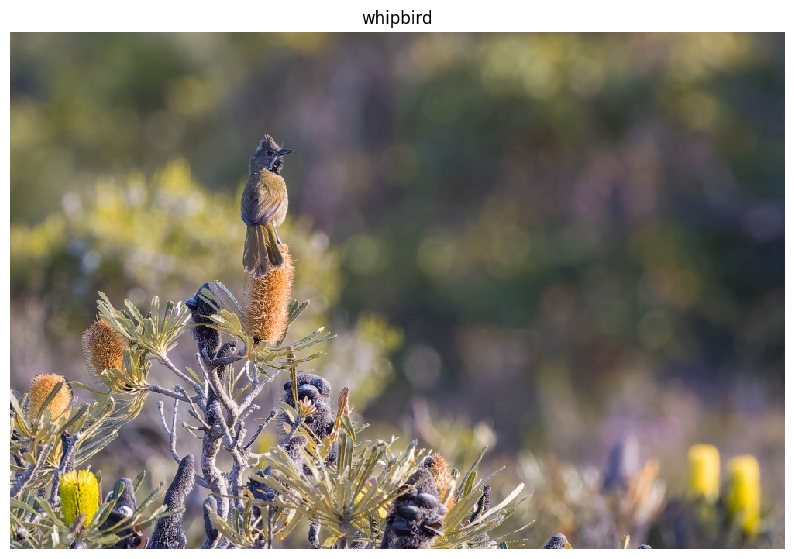

(667, 1000, 3)


In [156]:
image1 = load('images/whipbird.jpg')

display(image1, 'whipbird')

print_stats(image1)

Return to this question after reading through the rest of the assignment. Find **at least 2 more images** to use as test cases in this assignment for all the following questions and display them below. Use your print_stats() function to display their height, width and number of channels. Explain *why* you have chosen each image.

### Q1 Explanation contd.

I added a few more images to the mix for further testing, which are also displayed below using the same code. These are the images I chose and why I chose them:

- `handsomeguy.png`
    - I chose this image because it has a higher resolution (biggest file size out of all of them) and also because it has some interesting facial textures and smoothness. The image is also a `.png` file type so i wanted to see if there was a difference. This can be useful for looking at gaussian blur and seeing what details are lost in the process.
- `spiderman.jpg`
    - This image has sharper/stronger edges in terms of colour, which could be good for edge detection and contrast experiments.
- `greyscale.jpg`
    - Added this just to see how different greyscale images would look/behave. Could also be good for blob detection.

I have also used the included `mandrill.jpg` and `whipbird.jpg`

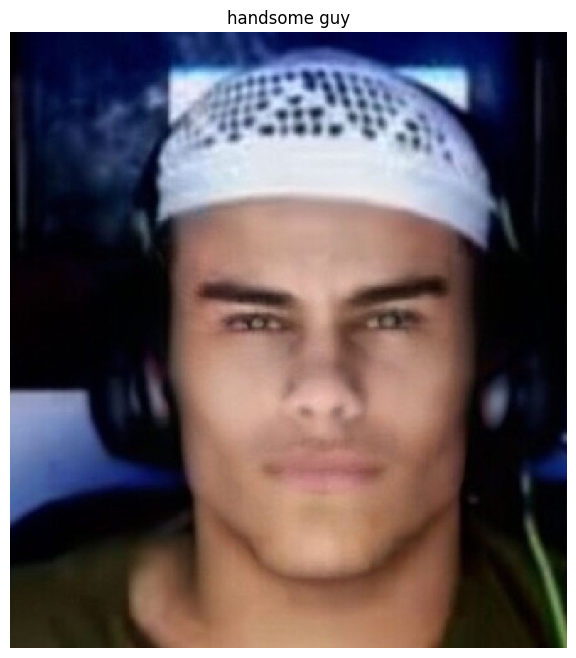

(868, 784, 4)


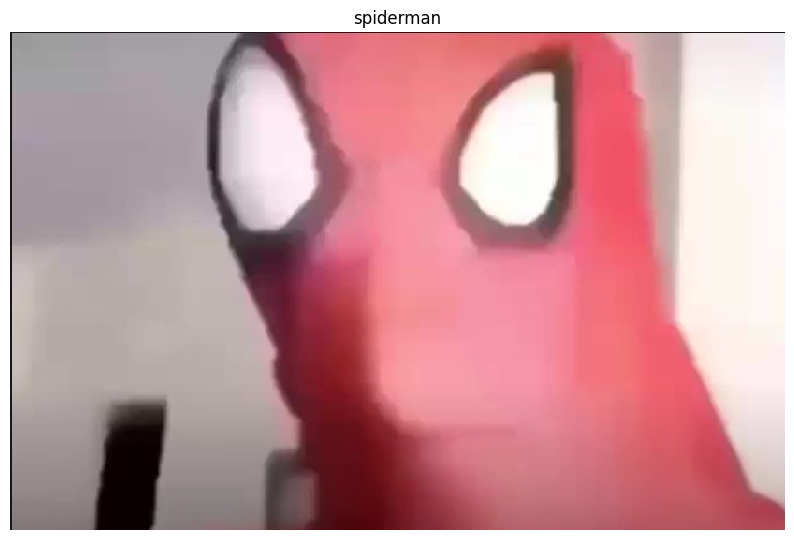

(532, 828, 3)


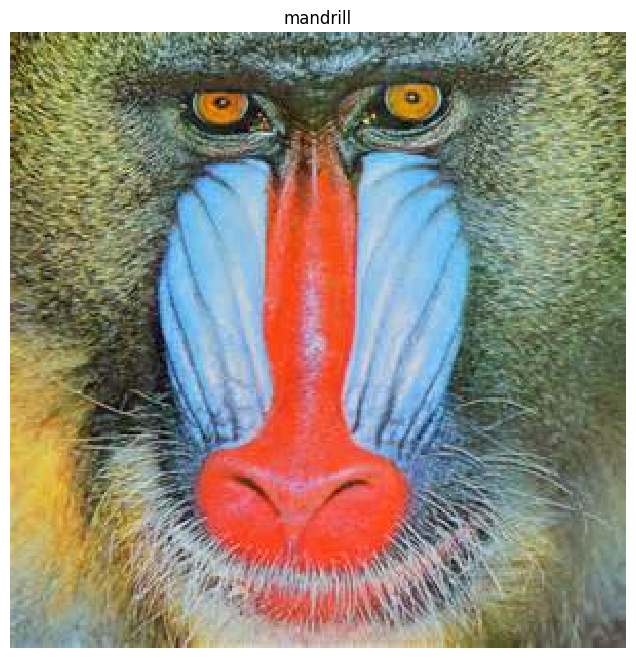

(300, 300, 3)


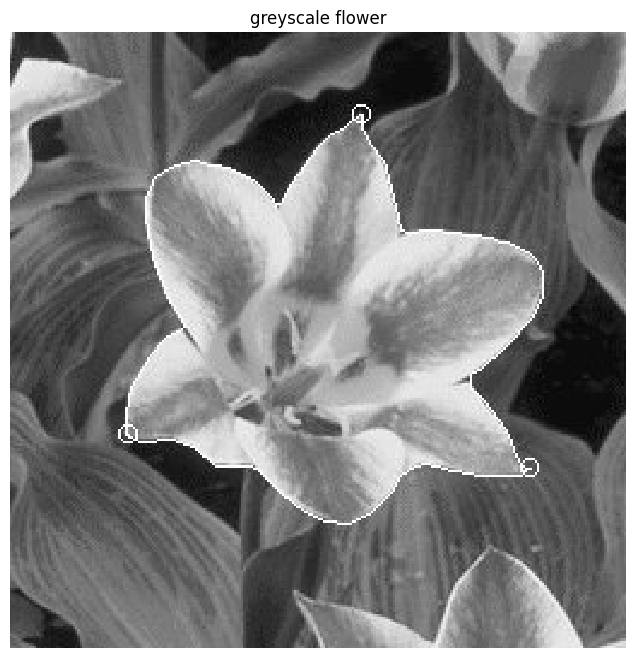

(256, 256)


In [157]:
### Your code to load and display your images here

image2 = load('images/handsomeguy.png')
image3 = load('images/spiderman.jpg')
image4 = load('images/mandrill.jpg')
image5 = load('images/greyscale.jpg')

display(image2, 'handsome guy')
print_stats(image2)
display(image3, 'spiderman')
print_stats(image3)
display(image4, 'mandrill')
print_stats(image4)
display(image5, 'greyscale flower')
print_stats(image5)

## Question 2: Image processing (30%)

Now that you have an image stored as a numpy array, let's try some operations on it.

1. Implement the `crop()` function in a1code.py. Use array slicing to crop the image.
2. Implement the `resize()` function in a1code.py.
3. Implement the `change_contrast()` function in a1code.py.
4. Implement the `greyscale()` function in a1code.py.
5. Implement the `binary()` function in a1code.py.

What do you observe when you change the threshold of the binary function?

Apply all these functions with different parameters on your own test images.

### Q2 Explanation

This question applies basic image processing operations to test images using the functions implemented in `a1code.py`.

The following functions were tested:
- `crop()`: crops a rectangular region of the image.
- `resize()`: rescales an image using nearest-neighbor interpolation.
- `change_contrast()`: modifies image contrast using a linear formula.
- `greyscale()`: converts RGB to grayscale using luminance weights.
- `binary()`: converts a grayscale image to black and white using a threshold.

Below are examples and outputs from each operation.

(868, 784, 4)


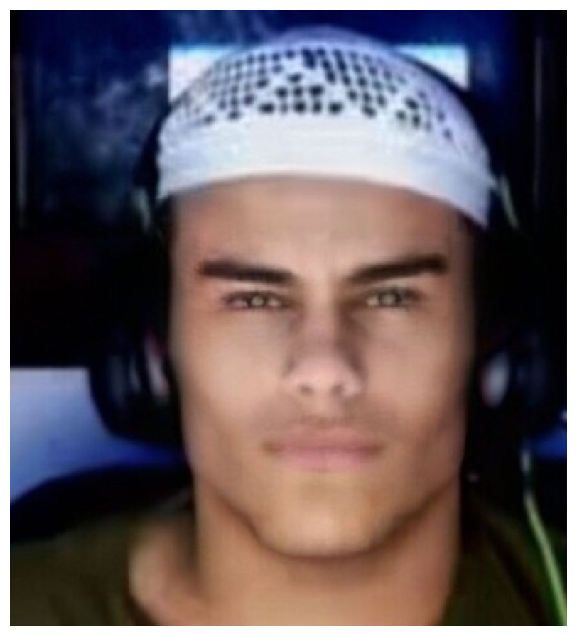

(868, 784, 4)


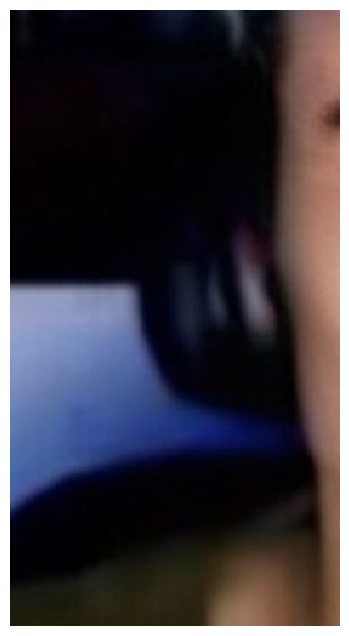

(508, 272, 4)


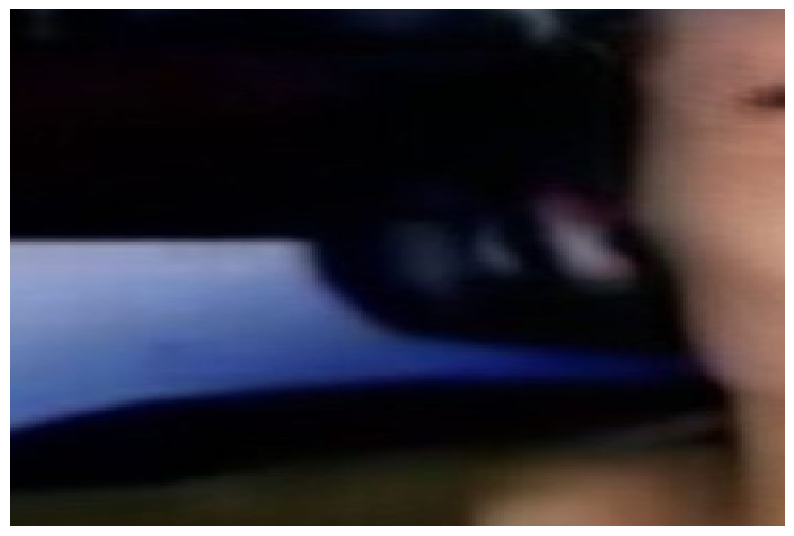

(667, 1000, 4)


In [158]:
# Test 1 : Crop and resize
# Display image
print_stats(image2)
display(image2)
print_stats(image2)

# Crop image
crop_img = crop(image2, 278, 5, 508, 272)
display(crop_img)
print_stats(crop_img)

# Resize cropped image
resize_img = resize(crop_img, 667, 1000)
display(resize_img)
print_stats(resize_img)

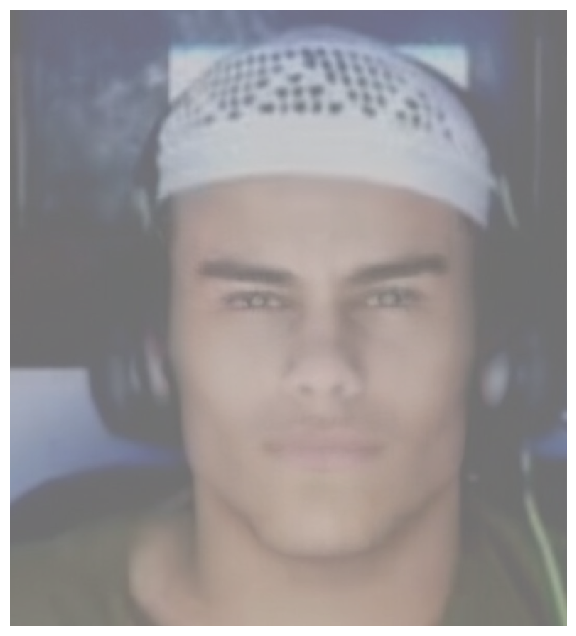

(868, 784, 4)


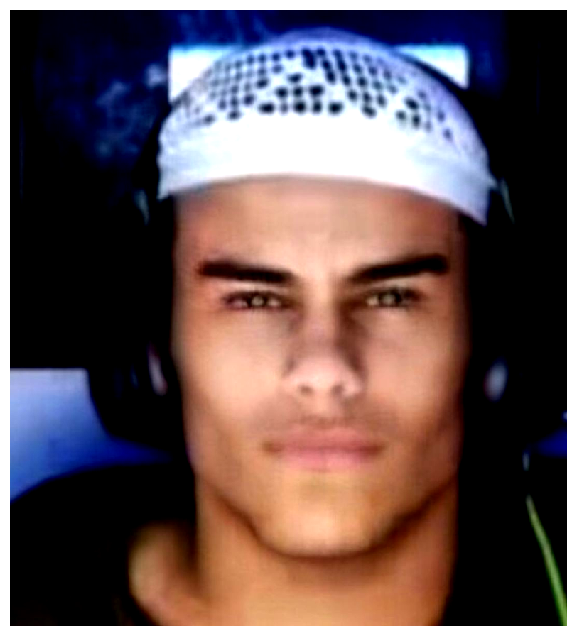

(868, 784, 4)


In [159]:
# Test 2: Contrast adjustment
# decrease contrast
low_contrast = change_contrast(image2, 0.5)
display(low_contrast)
print_stats(low_contrast)

# increase contrast
high_contrast = change_contrast(image2, 1.5)
display(high_contrast)
print_stats(high_contrast)

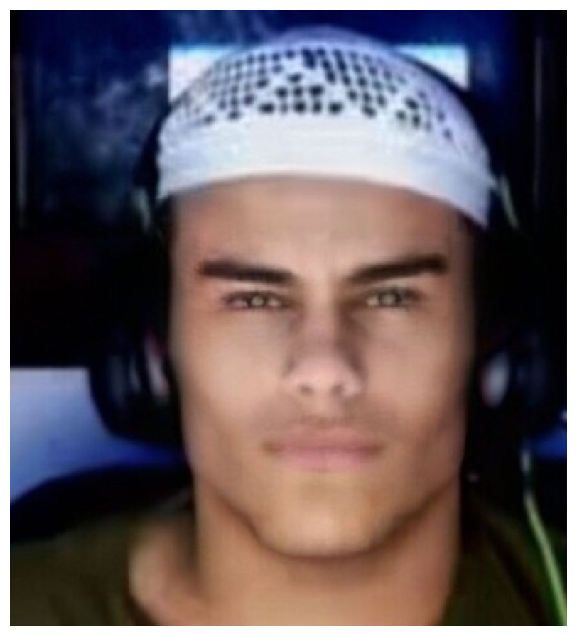

(868, 784, 4)


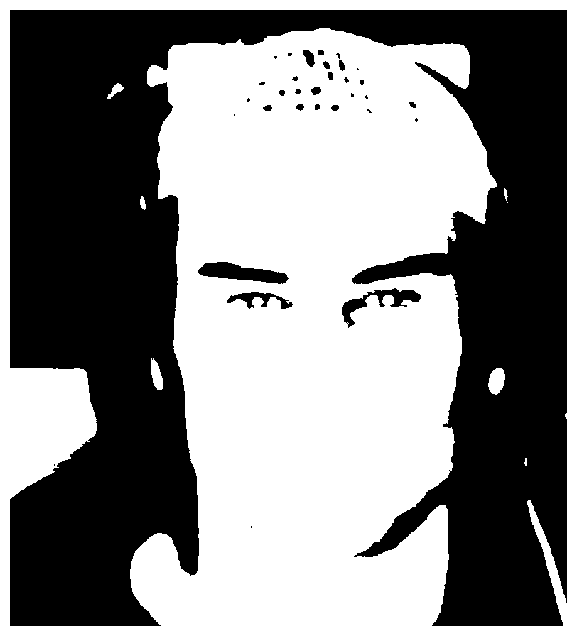

(868, 784)


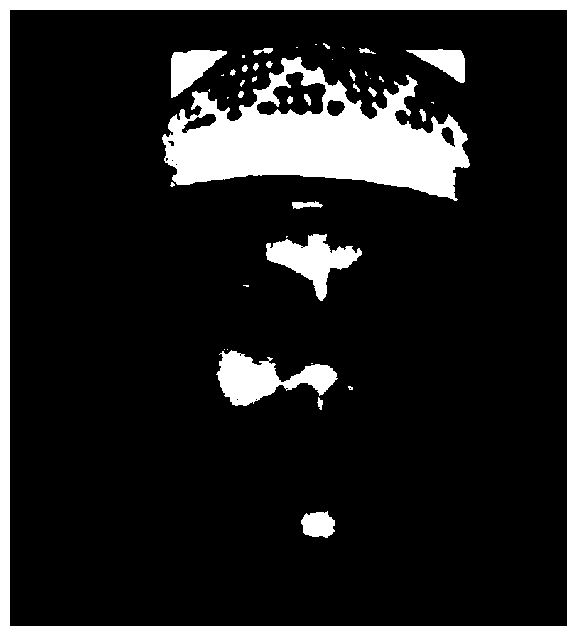

(868, 784)


In [160]:
# Test 3: greyscale + binary Thresholding
# Greyscale
grey_img = greyscale(image2)
display(image2)
print_stats(image2)

# Binary threshold = 0.3
binary_low = binary(grey_img, 0.3)
display(binary_low)
print_stats(binary_low)

# Binary threshold = 0.7
binary_high = binary(grey_img, 0.7)
display(binary_high)
print_stats(binary_high)

### Q2 Explanation contd.

- **Cropping and resizing** worked as expected using simple array slicing and scaling. The resized image kept the aspect ratio when dimensions were chosen properly.
- **Contrast**:
  - low contrast factor (0.5) compresses the dynamic range, making the image more muted.
  - high contrast factor (1.5) exaggerates the difference between light and dark areas.
- **Greyscale** converts the RGB image into a single-channel representation using  weighting (0.299 R + 0.587 G + 0.114 B).
- **Binary thresholding**:
  - **low threshold (0.3)**, more of the image becomes white (values >= threshold).
  - **high threshold (0.7)**, only the brightest parts remain white — much of the image turns black.
  - This demonstrates how thresholding can isolate bright regions or suppress noise depending on the context.

These image processing operations will be important for later filtering tasks.


## Question 3: Convolution (30%)

### 3.1(a) 2D convolution

Using the definition of 2D convolution from week 1, implement the convolution operation in the function `conv2D()` in a1code.py.


### Q3.1(a) Explanation

I implemented the `conv2D()` function from scratch using nested loops and kernel flipping, based on the mathematical definition of 2D convolution. The function:

- Pads the image using zero-padding
- Flips the kernel
- Slides it over the image
- Performs element-wise multiplication and summing over the region

I used a 9×9 grayscale image with a white square in the center, and used the convolution on it with an edge detection kernel:

\[
\begin{bmatrix}
1 & 0 & -1 \\
1 & 0 & -1 \\
1 & 0 & -1
\end{bmatrix}
\]

The output shows how the convolution highlights the vertical edges of the white square. The black and white regions in the result correspond to positive and negative gradients, and the fading are because of how convolution behaves near transitions.


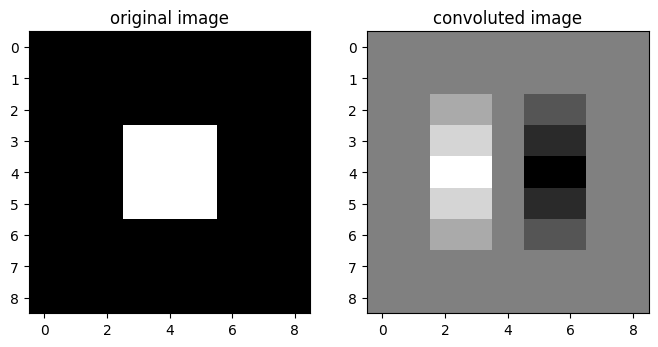

Convolved Output:
 [[ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  1.  1.  0. -1. -1.  0.  0.]
 [ 0.  0.  2.  2.  0. -2. -2.  0.  0.]
 [ 0.  0.  3.  3.  0. -3. -3.  0.  0.]
 [ 0.  0.  2.  2.  0. -2. -2.  0.  0.]
 [ 0.  0.  1.  1.  0. -1. -1.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.]]


In [161]:
test_conv2D()

### 3.1(b) RGB convolution

In the function `conv` in a1code.py, extend your function `conv2D` to work on RGB images, by applying the 2D convolution to each channel independently.

### Q3.1(b) Explanation

To extend the convolution function to RGB images, I implemented the `conv()` function, which applies the `conv2D()` function separately to each channel (R, G, B) of the input image.

I made my own test code called `test_convRGB` to test this, which applies a vertical edge detection kernel to a portrait image:

\[
\begin{bmatrix}
1 & 0 & -1 \\
1 & 0 & -1 \\
1 & 0 & -1
\end{bmatrix}
\]

The result is a darkened image with colorful neon-like edges. This is because:

- Each RGB channel has its own unique intensity gradients.
- When convoluted independently, each channel emphasizes different edges.
- When recombined, this results in a colorized edge image.

Which confirms that the convolution was applied independently to each channel and recombined correctly.


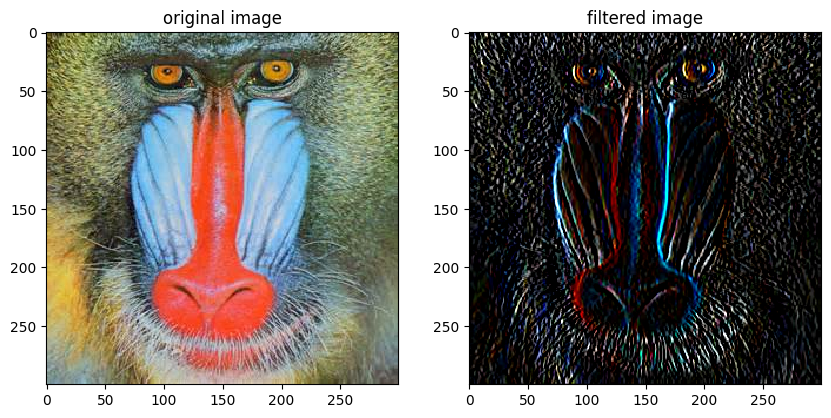

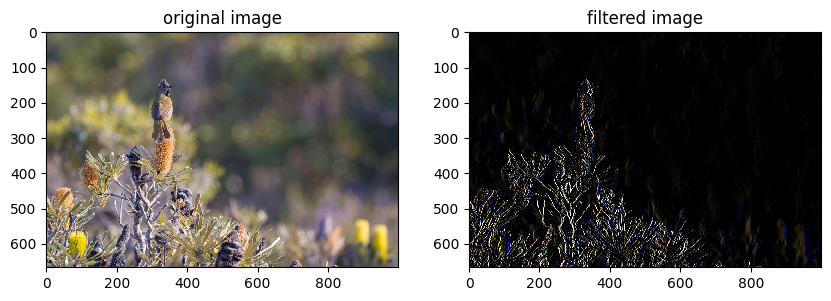

In [162]:
test_convRGB('images/mandrill.jpg')
test_convRGB('images/whipbird.jpg')

### 3.2 Gaussian filter convolution

Use the `gauss2D` function provided in a1code.py to create a Gaussian kernel, and apply it to your images with convolution. You will obtain marks for trying different tests and analysing the results, for example:

- try varying the image size, and the size and variance of the filter  
- subtract the filtered image from the original - this gives you an idea of what information is lost when filtering

What do you observe and why?

### Q3.2 Explanation

I applied a Gaussian blur to images using a kernel generated by the `gauss2D()` function. The blur was applied using the custom `conv()` function, which supports both grayscale and RGB images. This was tested using a function I made called `test_gaussian()`.

Gaussian filtering is used to reduce noise and detail. It makes the image smoother by averaging nearby pixel values, weighted by a Gaussian distribution.

### Observations

- Increasing the **kernel size** and **sigma** makes the image blurrier.
- A smaller sigma value (e.g., 0.5) slightly smooths the image.
- A larger sigma value (e.g., 2.0) removes fine details entirely.
- Edges and textures are progressively smoothed out, while overall colors remain similar.

### Visualizing Information Loss

To understand what details are lost during Gaussian filtering, I made a test function called `vis_loss()` which subtracts the blurred image from the original. This produces an image that highlights the **high-frequency components** — mostly edges and fine textures.

Below are results for different Gaussian kernel sizes and sigma values, and the visual loss.


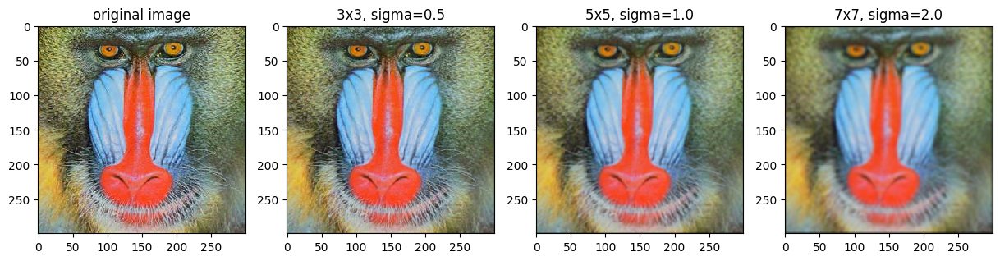

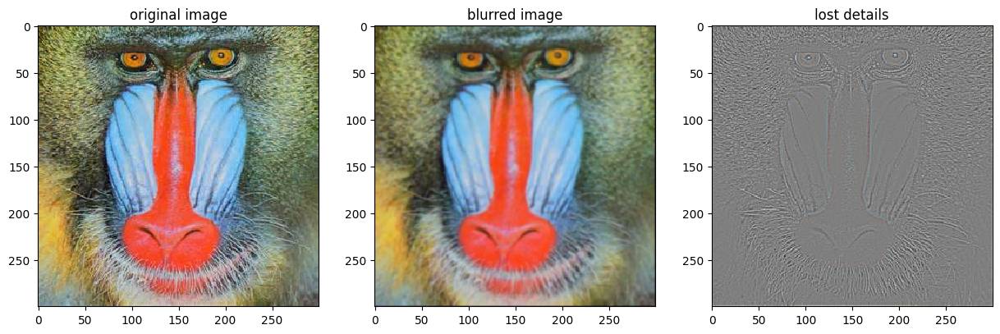

In [163]:
test_gaussian('images/mandrill.jpg')
vis_loss('images/mandrill.jpg')

### 3.3 Sobel filters

Define a horizontal and vertical Sobel edge filter kernel and test them on your images. You will obtain marks for testing them and displaying results in interesting ways, for example:

- apply them to an image at different scales
- considering how to display positive and negative gradients
- apply different combinations of horizontal and vertical filters as asked in the Assignment sheet.

### Q3.3 Explanation

Sobel filter detects edges in an image by computing the gradient of pixel intensities in the horizontal and vertical directions.

I used two 3×3 Sobel kernels:

- Horizontal Sobel (detects vertical edges):
\[
\begin{bmatrix}
-1 & 0 & 1 \\\\
-2 & 0 & 2 \\\\
-1 & 0 & 1
\end{bmatrix}
\]

- Vertical Sobel (detects horizontal edges):
\[
\begin{bmatrix}
-1 & -2 & -1 \\\\
0 & 0 & 0 \\\\
1 & 2 & 1
\end{bmatrix}
\]

The filters were applied to a grayscale image using the `sobel_filter()` function. I also computed the **gradient magnitude** to visualize the total edge strength at each pixel.

### Observations

- The **Sobel X filter** highlights vertical features (e.g., facial outline, hair strands).
- The **Sobel Y filter** captures horizontal features (e.g., eyebrows, mouth).
- The **gradient magnitude** combines both and gives a clean edge map.
- Areas of flat color or low contrast appear dark, while edges are bright.


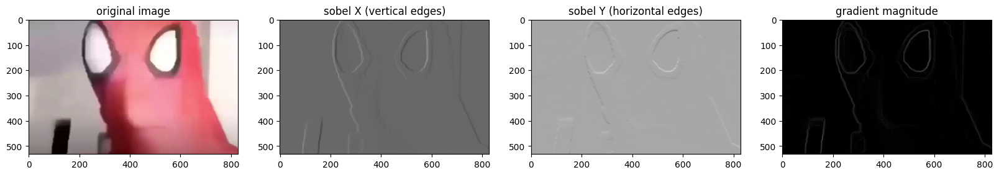

In [164]:
test_sobel('images/spiderman.jpg')

### Extra: Stacking Sobel Filters

I also tested applying the vertical Sobel filter to the result of the horizontal Sobel filter. This simulates second-order edge interactions.

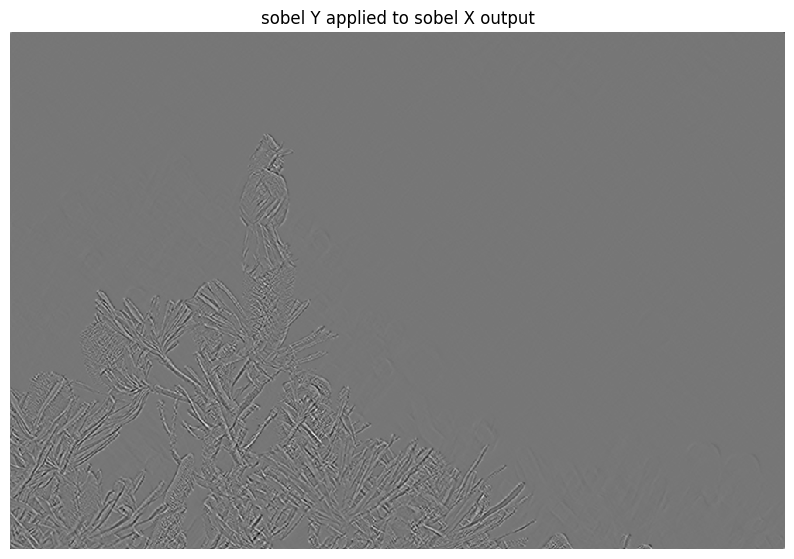

In [165]:
# Chain filters: vertical Sobel after horizontal
grey = greyscale(image1)

gx = conv2D(grey, sobel_x)
gxy = conv2D(gx, sobel_y)

plt.imshow(gxy, cmap='gray')
plt.title("sobel Y applied to sobel X output")
plt.axis("off")
plt.show()


## Question 4: Image sampling and pyramids (30%)

### 4.1 Image Sampling

- Apply your `resize()` function to reduce an image (I) to 0.5\*height and 0.5\*width

- Repeat the above procedure, but apply a Gaussian blur filter to your original image before downsampling it. How does the result compare to your previous output, and to the original image? Why?


### 4.2 Image Pyramids
- Create a Gaussian pyramid as described in week2's lecture on an image.

- Apply a Gaussian kernel to an image I, and resize it with ratio 0.5, to get $I_1$. Repeat this step to get $I_2$, $I_3$ and $I_4$.

- Display these four images in a manner analogus to the example shown in the lectures.




### Q4 Explanation

This section looks at image resolution and multi-scale representations. I used the `resize()` and `gaussian_filter()` functions to:

- Downsample images using nearest-neighbor interpolation.
- Apply Gaussian blur to reduce aliasing before downsampling.
- Construct a **Gaussian pyramid** showing progressively smaller, smoothed versions of an image.

### Q4.1 Explanation

I downsampled the image to half its original resolution using nearest-neighbor interpolation by making a function `test_downsampling()`.

Then, I repeated the downsampling, but applied a Gaussian blur beforehand to reduce aliasing.

This illustrates how pre-filtering improves visual quality when reducing resolution.

### Observations

- The **downsampled image** shows clear aliasing: sharp features become jagged or distorted.
- The **blurred + downsampled image** appears smoother and more natural.
- This is because components like edges and textures are removed by the Gaussian blur before resizing.
- Pre-filtering before downsampling is a common technique in image processing and computer graphics to preserve visual fidelity.


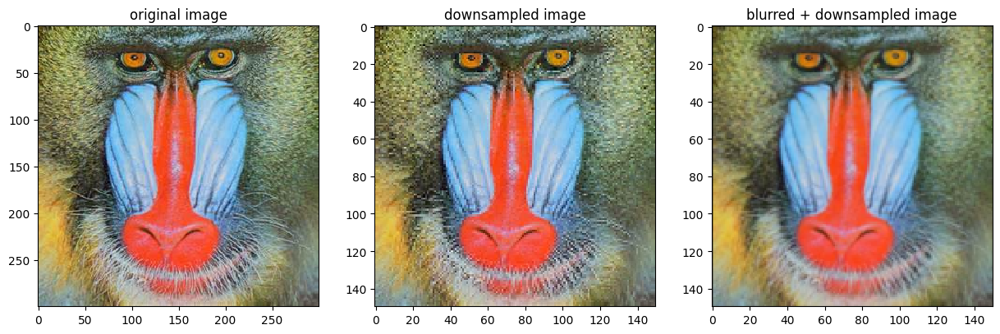

In [166]:
# 4.1
test_downsampling('images/mandrill.jpg')

### Q4.2 Explanation

**Gaussian pyramid** is a multi-scale representation of an image, constructed by:

1. Applying Gaussian blur
2. Downsampling the image by a factor of 0.5
3. Repeating the process multiple times

Each level contains a progressively smaller and blurrier version of the original image. This allows for efficient multi-resolution analysis in many computer vision applications.

I tested this by making a function called `display_pyramid()`

### Observations

- **Level 0** is the original image.
- Each subsequent level is:
  - Smaller in resolution (half width and height)
  - Progressively blurrier
  - Contains fewer visual details

This pyramid structure enables efficient processing at multiple resolutions — for example, detecting large and small features across scales.

It also forms the basis of many classic vision techniques like image blending and optical flow estimation.



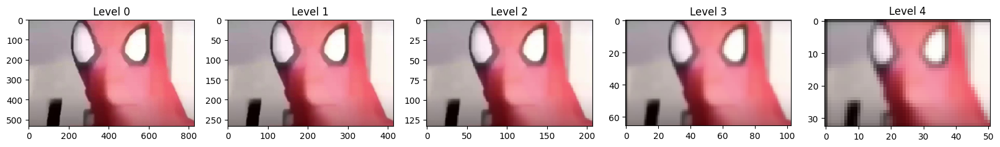

In [167]:
#4.2
display_pyramid('images/spiderman.jpg')

## Question 5: (optional, assesed for granting up to 20% bonus marks for the A1)

Image filtering lectures, particularly Lecture 2, have covered the details related to this question. This is a bonus question for the students to get opportunities to recover lost marks in the other parts of the assignment. **Note that the overall marks will be capped at 100%**.

### 5.1 Apply and analyse a blob detector

- Create a Laplacian of Gaussian (LoG) filter in the function `LoG2D()` and visualize its response on your images. You can use the template function (and hints therein) for the task if you wish.

- Modify parameters of the LoG filters and apply them to an image of your choice. Show how these variations are manifested in the output.

- Repeat the experiment by rescaling the image with a combination of appropriate filters designed by you for these assignment. What correlations do you find when changing the scale or modifying the filters?

- How does the response of LoG filter change when you rotate the image by 90 degrees? You can write a function to rotate the image or use an externally rotated image for this task.





## Q5 Explanation

I implemented and analysed a **Laplacian of Gaussian (LoG)** filter to detect blob-like structures in an image.

The LoG filter combines Gaussian smoothing (to reduce noise) with the Laplacian operator (to detect intensity changes).

This is useful for finding round-ish features — or "blobs" — in images. It is also rotation-invariant and responds well to edges at different scales.

The following was performed:
- Visualize the response of the LoG filter on a test image
- Analyze the effect of changing the kernel size and sigma
- Apply the filter at different image scales
- Analyze the filter’s behavior on a rotated image

### LoG Filter Response

The filtered image shows blobs and edges as bright and dark spots. The strongest responses appear around textured regions, such as the fur in the mandrill image.

Flat areas appear gray or uniform, while regions of changing intensity create strong contrast.

### Effect of Kernel Size and Sigma

- **small sigma** values (e.g., 1.0) captures fine-grained texture and detail.
- **larger sigma** values (e.g., 3.0) smooths out small details and only responds to larger structures.
- Increasing kernel size allows the filter to respond to wider spatial areas.

This shows how the LoG filter can be tuned to detect blobs at different scales.

### Effect of Image Scale on LoG

When the input image is resized to smaller scales, the LoG response becomes less detailed.

- Fine structures are lost at lower resolutions
- Only the largest blobs or features remain detectable

This shows why blob detection often requires applying LoG filters **at multiple image scales**, it ensures robustness to object size.

### Effect of Image Rotation

The LoG filter response remains largely consistent when the image is rotated 90°, which confirms that the Laplacian of Gaussian is not affected by rotation, and can detect features regardless of orientation.

This makes it especially useful in blob and keypoint detection tasks.

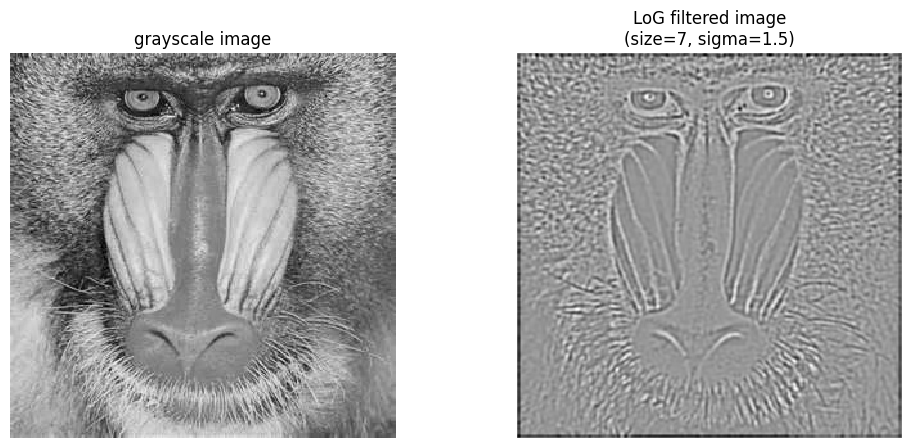

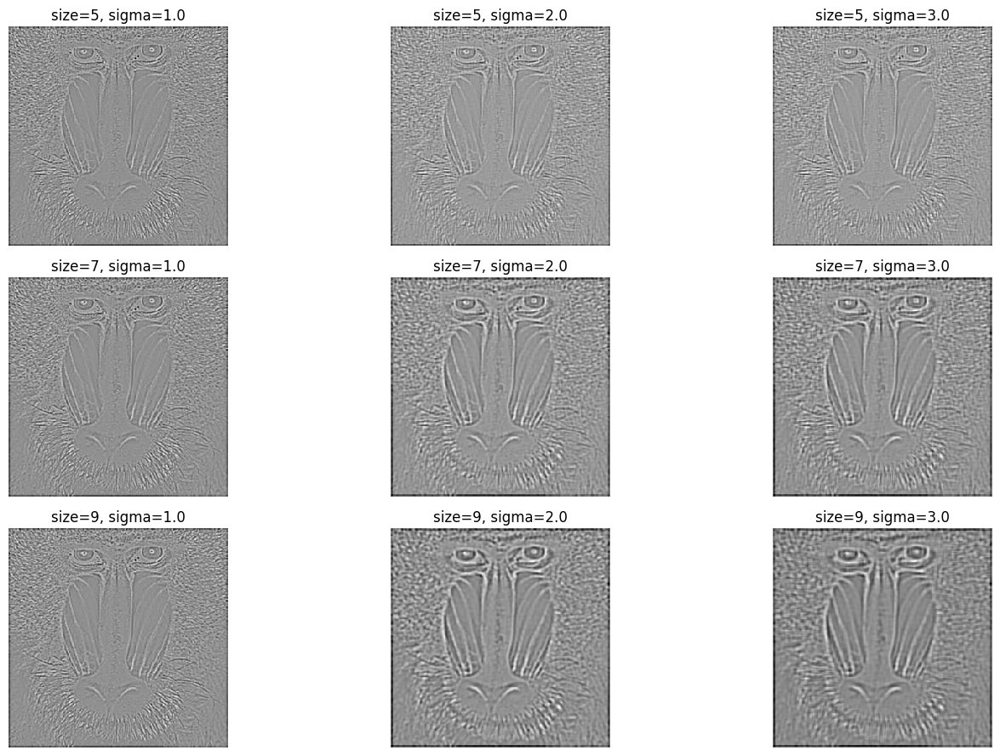

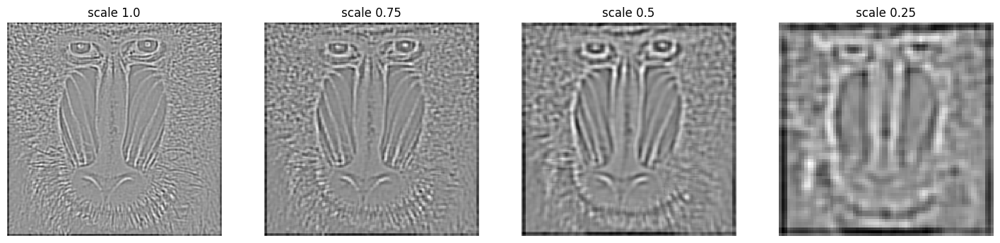

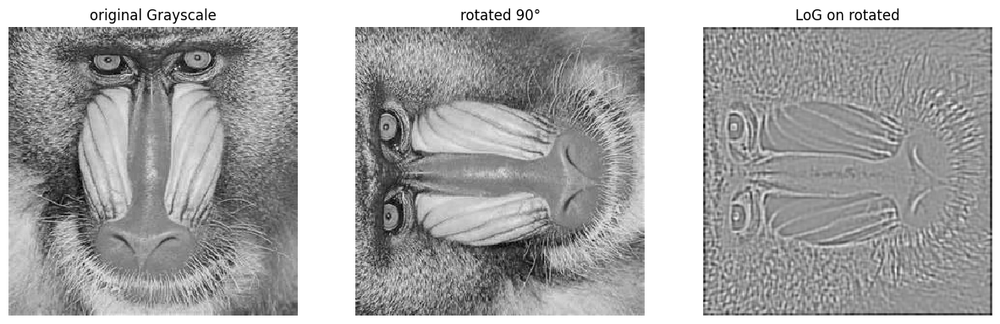

In [168]:
# Your code to answer question 5 and display results here
test_log('images/mandrill.jpg')
test_log_variations('images/mandrill.jpg')
test_log_multiscale('images/mandrill.jpg')
test_log_rotation('images/mandrill.jpg')